#1. Cài đặt thư viện

In [ ]:
!pip -q install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 109.9 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow
from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

#2. Nhập dữ liệu

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ITp9KLJZRdUa04sIw7c3")
project = rf.workspace("leafsensecoffee").project("leafsense_coffee_cls-bdcyw")
version = project.version(1)
dataset = version.download("folder")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to leafsense_coffee_cls-1 in folder:: 100%|██████████| 1281/1281 [00:00<00:00, 7822.63it/s]


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ITp9KLJZRdUa04sIw7c3")
project = rf.workspace("leafsensecoffee").project("leafsense_coffee-jrppw")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to leafsense_coffee-1 in yolov8:: 100%|██████████| 2540/2540 [00:00<00:00, 9103.57it/s]


#3. Thiết lập mô hình

In [ ]:
model_cls = YOLO("yolov8n-cls.pt")  # chọn model nhỏ (nano)
model_seg = YOLO("yolov8n-seg.pt")  # model nhỏ cho segmentation

#4. Huấn luyện mô hình YOLOv8

##4.1. Huấn luyện Classification (YOLOv8-cls)

In [ ]:
model = YOLO("yolov8n-cls.pt")
model.train(
    data="/content/leafsense_coffee_cls-1",
    epochs=50,
    imgsz=224,
    batch=16,
    device=0,
    project="runs_cls",
    name="coffee_cls_v1"
)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/leafsense_coffee_cls-1, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=coffee_cls_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79db34d558e0>
curves: []
curves_results: []
fitness: 1.0
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 1.0, 'metrics/accuracy_top5': 1.0, 'fitness': 1.0}
save_dir: PosixPath('/content/runs_cls/coffee_cls_v1')
speed: {'preprocess': 0.24531531200045717, 'inference': 0.5454848240005958, 'loss': 0.00036439999530557543, 'postprocess': 0.0006208160048117861}
task: 'classify'
top1: 1.0
top5: 1.0

##4.2. Huấn luyện Segmentation (YOLOv8-seg)

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n-seg.pt")
model.train(
    data="/content/leafsense_coffee-1/data.yaml",
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,
    project="runs_seg",
    name="coffee_seg_v1"
)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/leafsense_coffee-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=coffee_seg_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, 

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79da230a1af0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0

#5. Đánh giá mô hình

In [ ]:
def show_img(path):
  img = cv2.imread(path)
  cv2_imshow(img)

  return None

## 5.1. Đánh giá mô hình Classification (YOLOv8-cls)

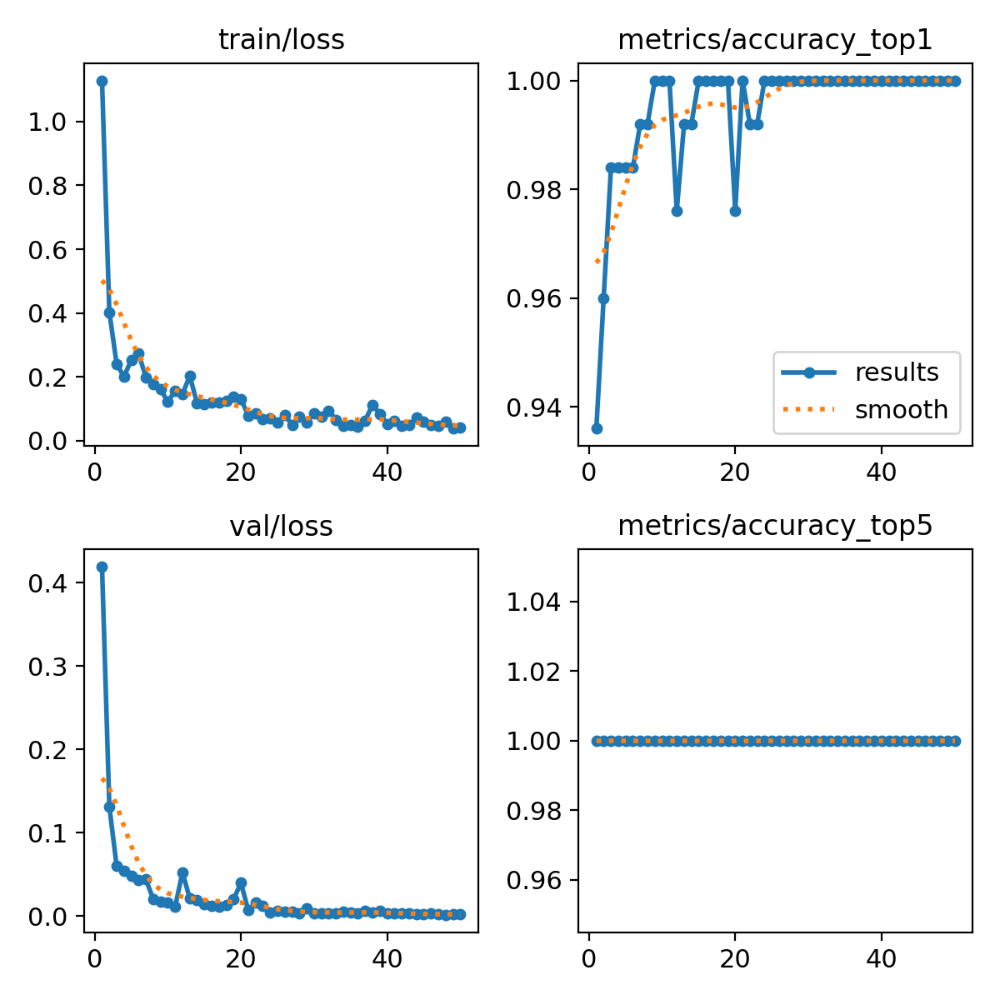

In [ ]:
show_img("/content/runs_cls/coffee_cls_v1/results.png")

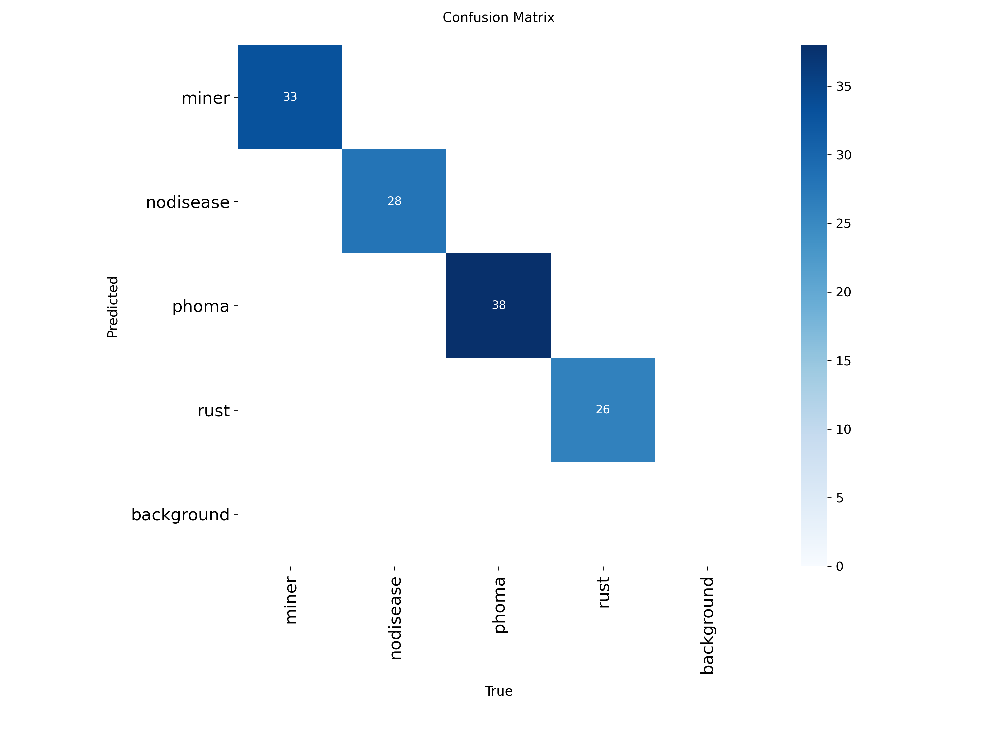

In [ ]:
show_img("/content/runs_cls/coffee_cls_v1/confusion_matrix.png")

##5.2. Đánh giá mô hình Segmentation (YOLOv8-seg)

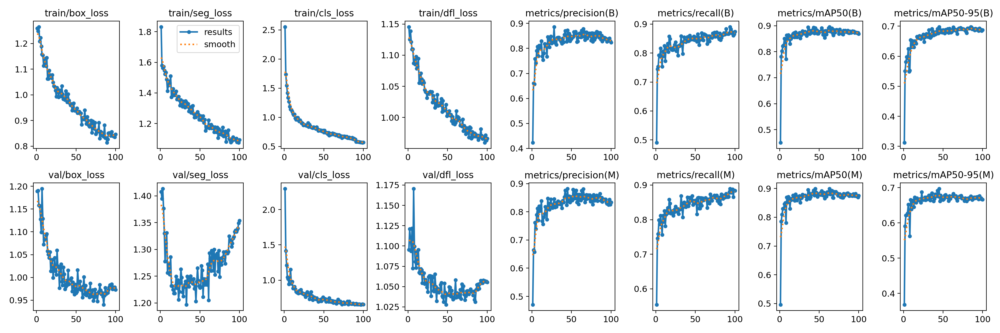

In [ ]:
show_img("/content/runs_seg/coffee_seg_v1/results.png")

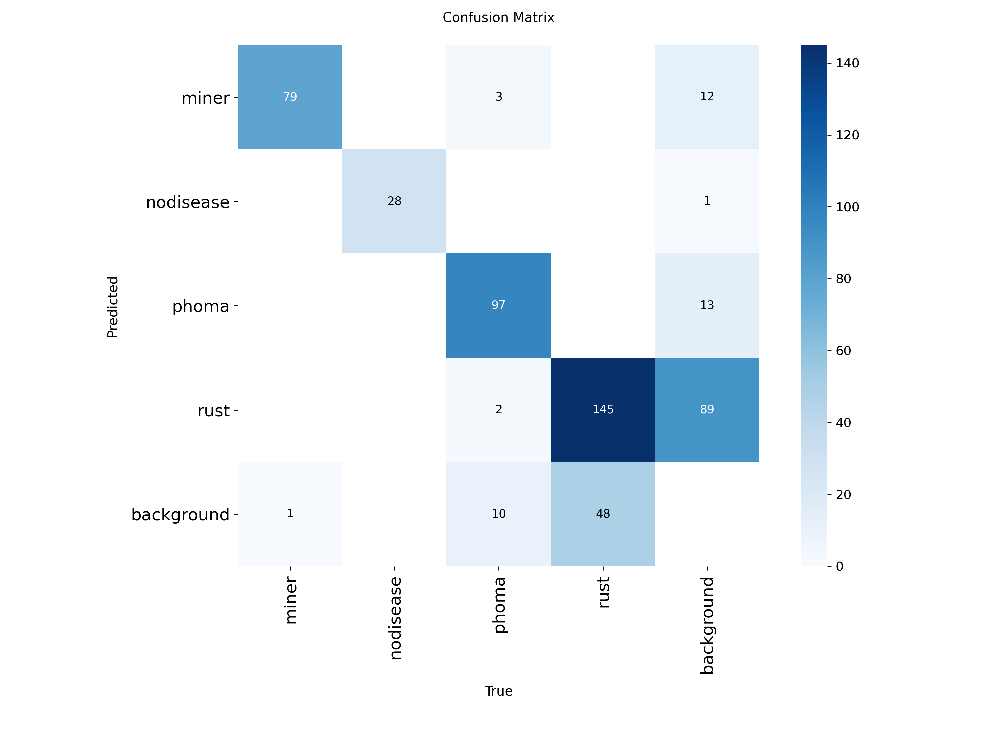

In [ ]:
show_img("/content/runs_seg/coffee_seg_v1/confusion_matrix.png")

#6. Kiểm chứng độ chính xác của mô hình với bộ dữ liệu Test

##6.1. Classification (YOLOv8-cls)

In [ ]:
model = YOLO("/content/runs_cls/coffee_cls_v1/weights/best.pt")

metrics = model.val(data="/content/leafsense_coffee_cls-1", split="test")
print(metrics)

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-cls summary (fused): 30 layers, 1,440,004 parameters, 0 gradients, 3.3 GFLOPs
train: /content/leafsense_coffee_cls-1/train... found 1010 images in 4 classes ✅ 
val: /content/leafsense_coffee_cls-1/valid... found 125 images in 4 classes ✅ 
test: /content/leafsense_coffee_cls-1/test... found 129 images in 4 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.0 ms, read: 492.0±242.7 MB/s, size: 24.1 KB)
test: Scanning /content/leafsense_coffee_cls-1/test... 129 images, 0 corrupt: 100% ━━━━━━━━━━━━ 129/129 318.8Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 9/9 10.1it/s 0.9s
                   all          1          1
Speed: 0.4ms preprocess, 0.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val6
ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix objec

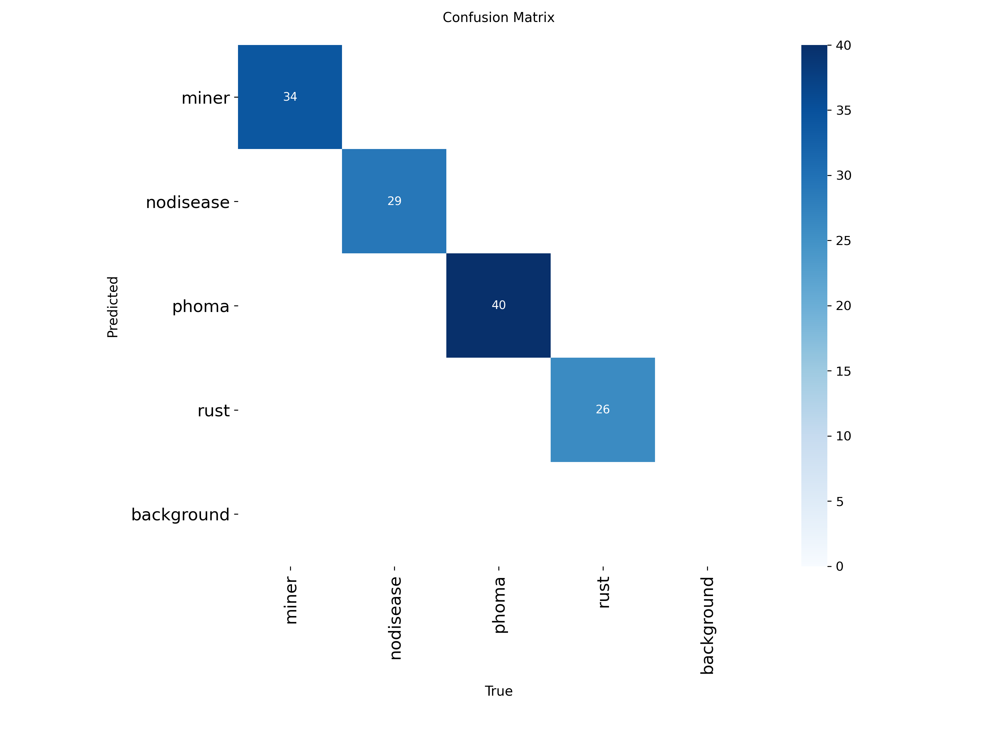

In [ ]:
show_img("/content/runs/classify/val6/confusion_matrix.png")

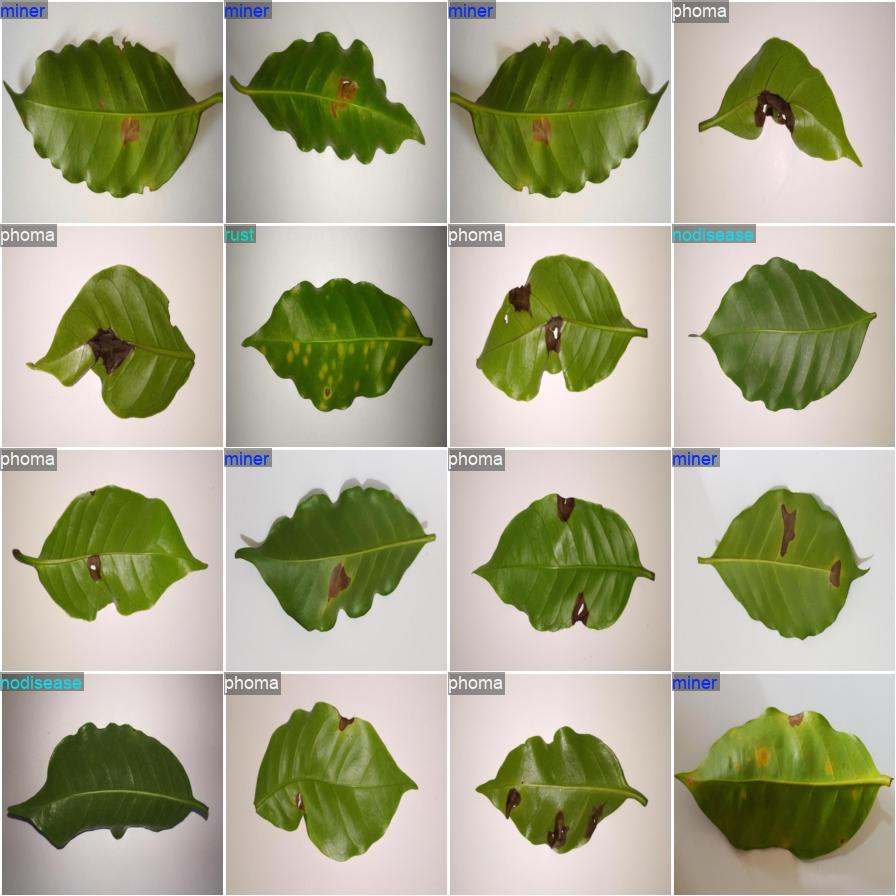

In [ ]:
show_img("/content/runs/classify/val6/val_batch2_pred.jpg")

##6.2. Segmentation (YOLOv8-seg)

In [ ]:
model = YOLO("/content/runs_seg/coffee_seg_v1/weights/best.pt")

metrics = model.val(data="/content/leafsense_coffee-1/data.yaml", split="test")
print(metrics)


Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,844 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 690.3±262.0 MB/s, size: 21.6 KB)
val: Scanning /content/leafsense_coffee-1/test/labels.cache... 129 images, 129 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 129/129 141.7Kit/s 0.0s
WARNING ⚠️ Labels are missing or empty in /content/leafsense_coffee-1/test/labels.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 2.6it/s 3.5s


Mean of empty slice.
invalid value encountered in scalar divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.
Mean of empty slice.
invalid value encountered in scalar divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.
invalid value encountered in divide
Mean of empty slice.


                   all        129          0          0          0          0          0          0          0          0          0
WARNING ⚠️ no labels found in segment set, can not compute metrics without labels
Speed: 0.3ms preprocess, 9.6ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to /content/runs/segment/val4
ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([], dtype=int64)
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79db8ef51100>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.

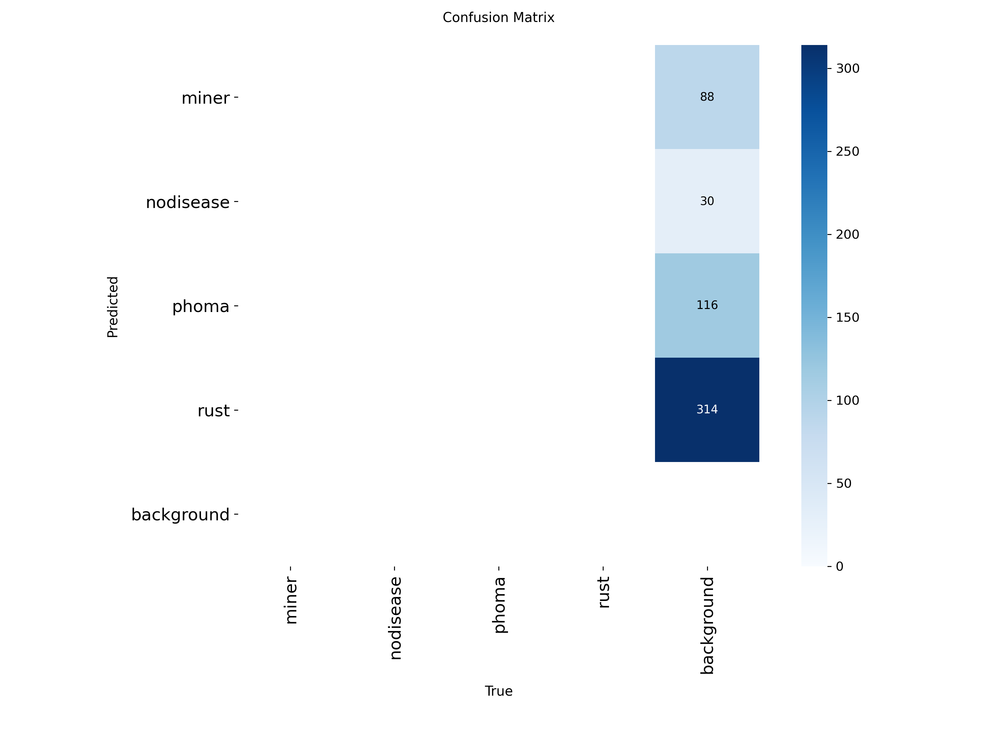

In [ ]:
show_img("/content/runs/segment/val4/confusion_matrix.png")

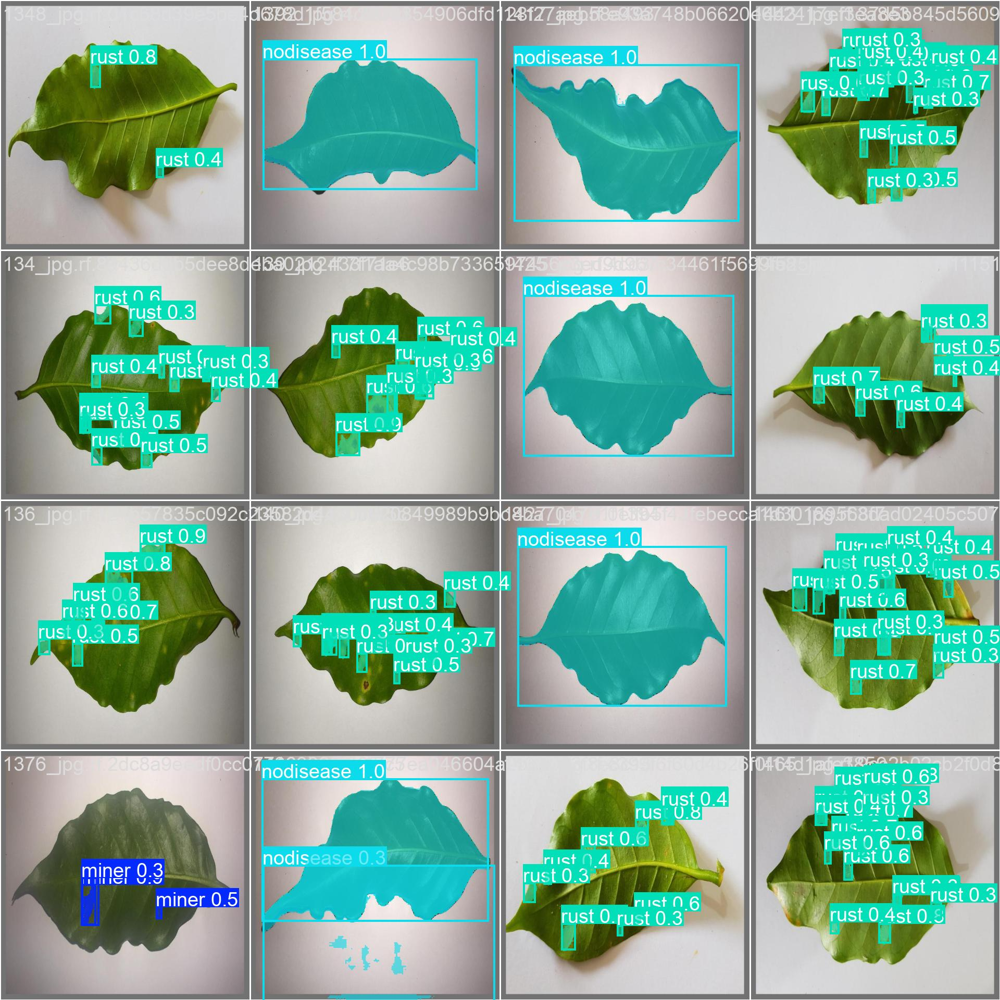

In [ ]:
show_img("/content/runs/segment/val4/val_batch1_pred.jpg")